# TOC
* [Datasets summary](#data_summ)
* [Testing routine](#ip_code)
* [Tests](#tests)

# Setup

In [1]:
import copy

from IPython.display import display, Markdown
from matplotlib import pyplot as plt
import numpy as np

from fns import get_datasets


DATA_DIR_PATH = "data"

# Datasets summary <a name="data_summ"/>

Note: a "dataset" corresponds to a splitting protocol run, while a "run" corresponds to a CCI imaging cycle covering one column of the source plate.

In [2]:
ds_names, run_names, bg_paths, fg_paths, counts = \
    get_datasets(data_dir_path=DATA_DIR_PATH)

display(Markdown(
    "| Dataset names | Run names |\n"
    "| :--- | :--- |\n"
    + "\n".join(
        f"| {f'`{ds_name}`' if not i else ''} | `{run_name}` |"
        for ds_name in ds_names
        for (i, run_name) in enumerate(run_names[ds_name]))
))

print(f"Found {len(ds_names)} datasets with "
      f"{sum(len(x) for x in run_names.values())} total runs.")

| Dataset names | Run names |
| :--- | :--- |
| `20210818-155427` | `20210818-155555` |
|  | `20210818-160539` |
|  | `20210818-161419` |
|  | `20210818-162359` |
|  | `20210818-163241` |
|  | `20210818-164123` |
|  | `20210818-165004` |
|  | `20210818-165844` |
|  | `20210818-170723` |
|  | `20210818-171605` |
|  | `20210818-172444` |
|  | `20210818-173322` |
| `20210823-152540` | `20210823-152708` |
|  | `20210823-153549` |
|  | `20210823-154429` |
|  | `20210823-155344` |
|  | `20210823-160223` |
|  | `20210823-161059` |
|  | `20210823-161936` |
|  | `20210823-162814` |
|  | `20210823-163652` |
|  | `20210823-164530` |
|  | `20210823-165407` |
|  | `20210823-170244` |
| `20211008-193754` | `20211008-193922` |
|  | `20211008-194840` |
|  | `20211008-195700` |
|  | `20211008-202231` |
|  | `20211008-202335` |
|  | `20211008-203435` |
|  | `20211008-204256` |
|  | `20211008-205120` |
|  | `20211008-205941` |
|  | `20211008-210802` |
|  | `20211008-211626` |
|  | `20211008-212445` |
| `20211012-181651` | `20211012-181818` |
|  | `20211012-182810` |
|  | `20211012-183704` |
|  | `20211012-184643` |
|  | `20211012-185537` |
|  | `20211012-190430` |
|  | `20211012-191322` |
|  | `20211012-192213` |
|  | `20211012-193103` |
|  | `20211012-193952` |
|  | `20211012-194841` |
|  | `20211012-195729` |
| `20211014-142226` | `20211014-142353` |
|  | `20211014-143350` |
|  | `20211014-144248` |
|  | `20211014-145243` |
|  | `20211014-150141` |
|  | `20211014-151035` |
|  | `20211014-151927` |
|  | `20211014-152818` |
|  | `20211014-153709` |
|  | `20211014-154559` |
|  | `20211014-155449` |
|  | `20211014-160339` |
| `20211018-173702` | `20211018-173829` |
|  | `20211018-174745` |
|  | `20211018-175600` |
|  | `20211018-180514` |
|  | `20211018-181330` |
|  | `20211018-182145` |
|  | `20211018-183000` |
|  | `20211018-183820` |
|  | `20211018-184628` |
|  | `20211018-185447` |
|  | `20211018-190306` |
|  | `20211018-191130` |

Found 6 datasets with 72 total runs.


# Testing routine <a name="ip_code"/>

In [75]:
SHOW_DIAG_IMGS = False
# ^ Turn this on to get a lot of plots of information from intermediate steps

SHOW_INPUT_IMGS = True
# ^ Turn this on for the big red/blue composite image showing the FG over the BG
INPUT_IMG_PLOT_VMIN = 0.10
INPUT_IMG_PLOT_VMAX = 0.25
# ^ These two control range clipping for the FG/BG composite image


import matplotlib.patches
import numpy as np
import scipy.ndimage
import skimage.filters
import skimage.io
import skimage.transform

from cci_image_processing import CciCellCounterResult


class Tester():
    def __init__(self, name, counter_cls, counting_params = None, pp_params = None):
        self.name = name
        if counting_params is None:
            counting_params = {}
        if pp_params is None:
            pp_params = {}
        self.last_bg_path = None
        self.pp_params = pp_params
        self.counting_params = counting_params
        self.counter = counter_cls()
        self.counter.init_preprocessing(**pp_params)
        self.counter.init_counting(**counting_params)

    def process_image_pair(self, fg_path, bg_path):
        if bg_path != self.last_bg_path:
            self.counter.set_bg_image_from_path(bg_path)
        result = self.counter.process_fg_image_from_path(fg_path)
        return result


def do_the_test(testers, ds_name, run_name, lane_no, keep_all=False):
    global bg_paths, fg_paths, counts
    
    cmap = copy.copy(plt.cm.gray)
    cmap.set_bad('b', 1.0)
    cmap.set_over("g", 1.0)
    
    bg_path = bg_paths[ds_name][run_name][lane_no]
    fg_path = fg_paths[ds_name][run_name][lane_no]

    results = {}
    for tester in testers:
        result = tester.process_image_pair(fg_path, bg_path)
        results[tester.name] = result

    if SHOW_INPUT_IMGS:
        bg_img, fg_img = (skimage.io.imread(p)/65535. for p in (bg_path, fg_path))

#         if "input_rescale_factor" in tester.pp_params:
#             bg_img, fg_img = (
#                 skimage.transform.rescale(
#                     o, tester.pp_params["input_rescale_factor"], anti_aliasing=True)
#                 for o in (bg_img, fg_img))
        for tester in reversed(testers):
            pp_info = results[tester.name].pp_info
            if "shift" in pp_info:
                fg_img = scipy.ndimage.shift(fg_img, pp_info["shift"], order=1)
                fg_img -= bg_img
                break
            
        plt.figure(figsize=(12.,12.), frameon=False)
        plot_img = np.zeros((bg_img.shape[0], bg_img.shape[1], 3))
        plot_vmax = INPUT_IMG_PLOT_VMAX - INPUT_IMG_PLOT_VMIN
        plot_img[...,2] = ((bg_img - INPUT_IMG_PLOT_VMIN)/plot_vmax).clip(0., 1.)
        plot_img[...,0] = (fg_img/plot_vmax).clip(0., 1.)
        plt.imshow(plot_img, vmin=0, vmax=INPUT_IMG_PLOT_VMAX)

        if "crop_roi_size" in tester.pp_params:
            crop_w, crop_h = tester.pp_params["crop_roi_size"]
            ax = plt.axes()
            ax.add_patch(matplotlib.patches.Rectangle(
                ((bg_img.shape[1] - crop_w)/2., (bg_img.shape[0] - crop_h)/2.),
                crop_w, crop_h, lw=1.0, fc="none", ec="white"))
            
        fname = "%s-%s-%s.png" % (ds_name, run_name, lane_no)
        plt.xticks([])
        plt.yticks([])
        
        width_crop_margin = int((bg_img.shape[1] - crop_w)/2.)
        height_crop_margin = int((bg_img.shape[0] - crop_h)/2.)
        
        plot_img_cropped = plot_img[height_crop_margin:-1*height_crop_margin, width_crop_margin:-1*width_crop_margin]
        skimage.io.imsave(fname, (plot_img_cropped*65535).astype(np.uint16))

#         print(width_crop_margin)
#         print(plot_img_cropped.shape)

#         skimage.io.imsave('skimage_imsave_plot_img_'+fname, (plot_img*65535).astype(np.uint16))
#         skimage.io.imsave('skimage_imsave_fg_img_'+fname, (fg_img*65535).astype(np.uint16))
#         plt.savefig('plt_savefig_' + fname, frameon=False, orientation='landscape', pad_inches=0)

        plt.show()
        
    return results

# Saving <a name="tests"/>

In [7]:
images = [
    'image-input-20211008-193922-7.tif',
    'image-input-20211008-194840-6.tif',
    'image-input-20211008-195700-3.tif',
    'image-input-20211008-202231-3.tif',
    'image-input-20211008-203435-2.tif',
    'image-input-20211012-181818-6.tif',
    'image-input-20211012-182810-4.tif',
    'image-input-20211012-183704-3.tif',
    'image-input-20211012-184643-7.tif',
    'image-input-20211012-191322-1.tif',
    'image-input-20211014-142353-0.tif',
    'image-input-20211014-143350-4.tif',
    'image-input-20211014-144248-3.tif',
    'image-input-20211014-145243-5.tif',
    'image-input-20211014-155449-6.tif',
    'image-input-20211018-173829-0.tif',
    'image-input-20211018-174745-1.tif',
    'image-input-20211018-181330-0.tif',
    'image-input-20211018-183820-1.tif',
    'image-input-20211018-185447-3.tif'
]

In [25]:
ds_name_dict = {
    '20211008':'20211008-193754',
    '20211012':'20211012-181651',
    '20211014':'20211014-142226',
    '20211018':'20211018-173702'
}

In [29]:
to_analyze = []
for i in range(len(images)):
    image = images[i]
    tokens = image.split('-')
    ds_name = ds_name_dict[tokens[2]]
    run_name = '%s-%s' % (tokens[2], tokens[3])
    lane_no = int(tokens[-1].split('.')[0])
    to_analyze.append((ds_name, run_name, lane_no))

## Run `20211008-193754`:`20211008-193922` lane 7

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


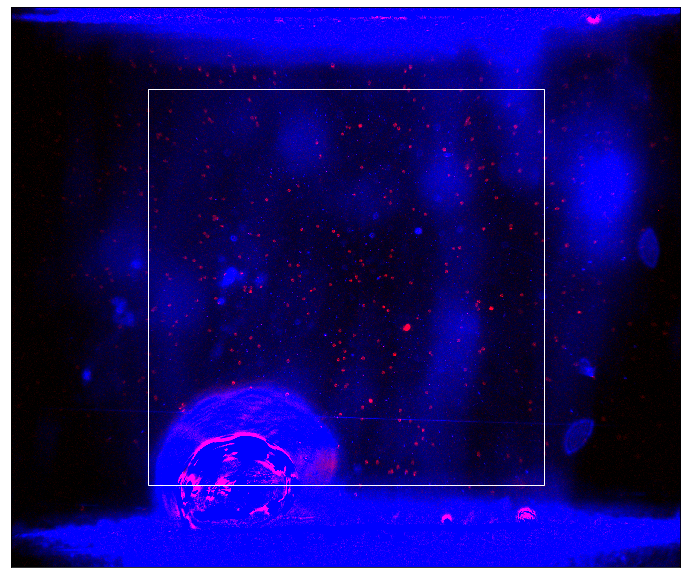

## Run `20211008-193754`:`20211008-194840` lane 6

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


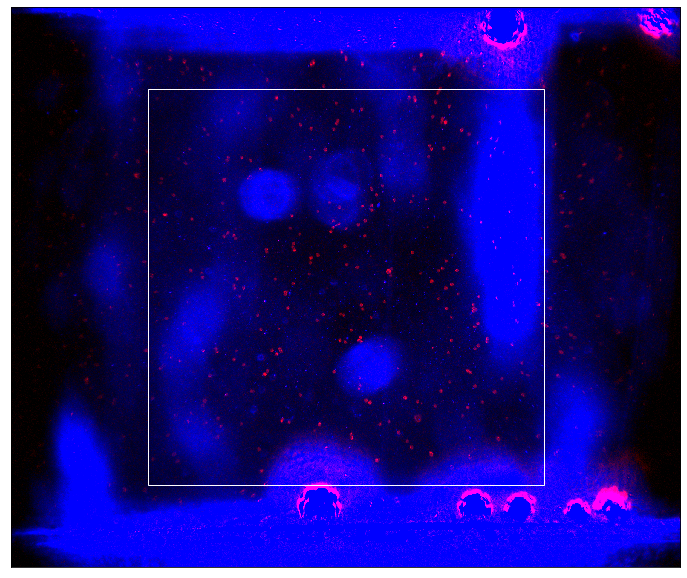

## Run `20211008-193754`:`20211008-195700` lane 3

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


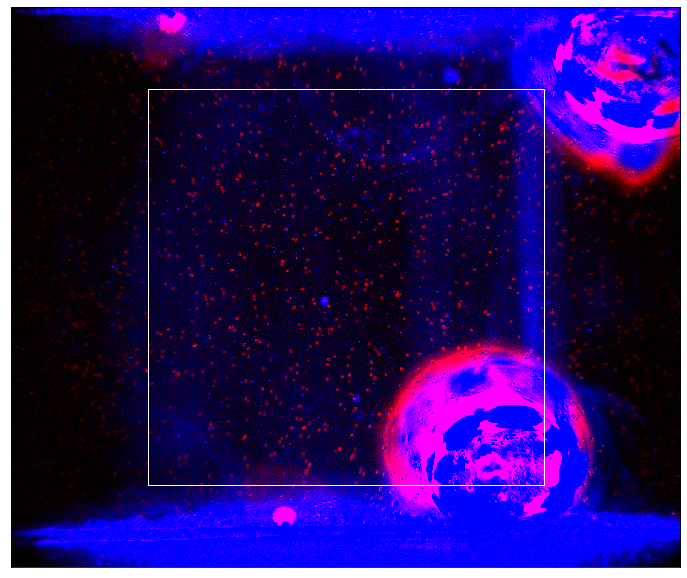

## Run `20211008-193754`:`20211008-202231` lane 3

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


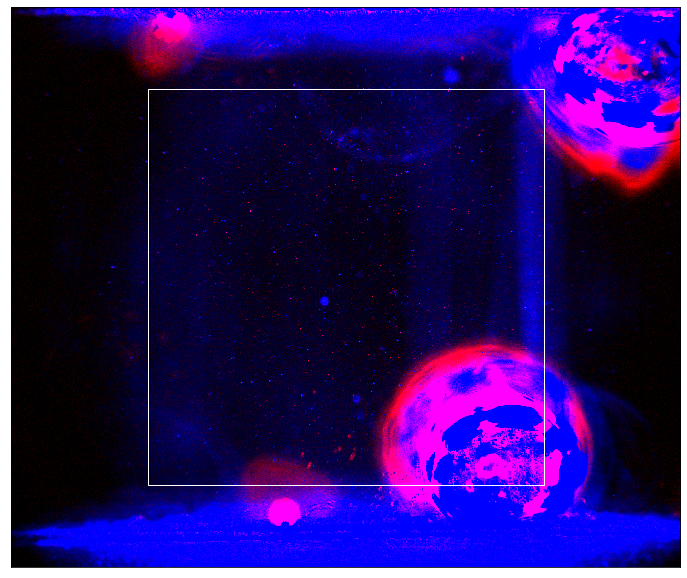

## Run `20211008-193754`:`20211008-203435` lane 2

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


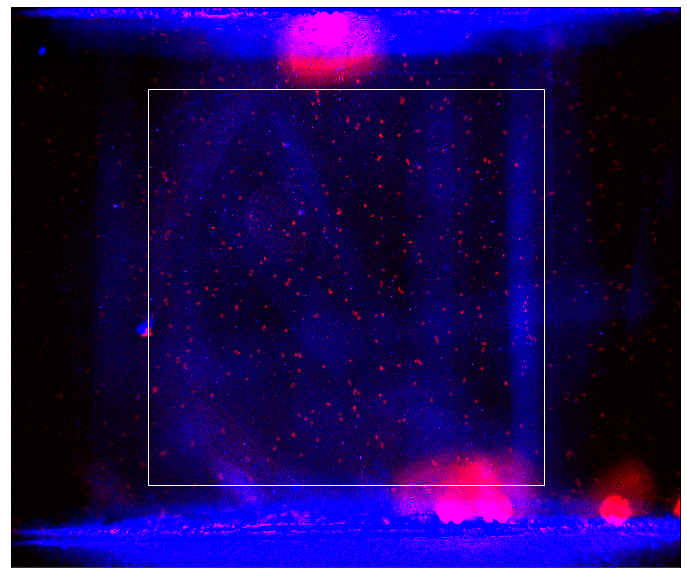

## Run `20211012-181651`:`20211012-181818` lane 6

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


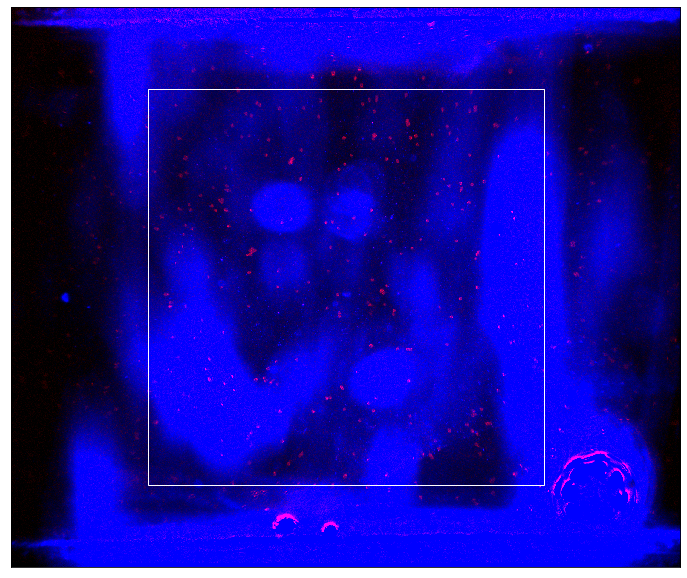

## Run `20211012-181651`:`20211012-182810` lane 4

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


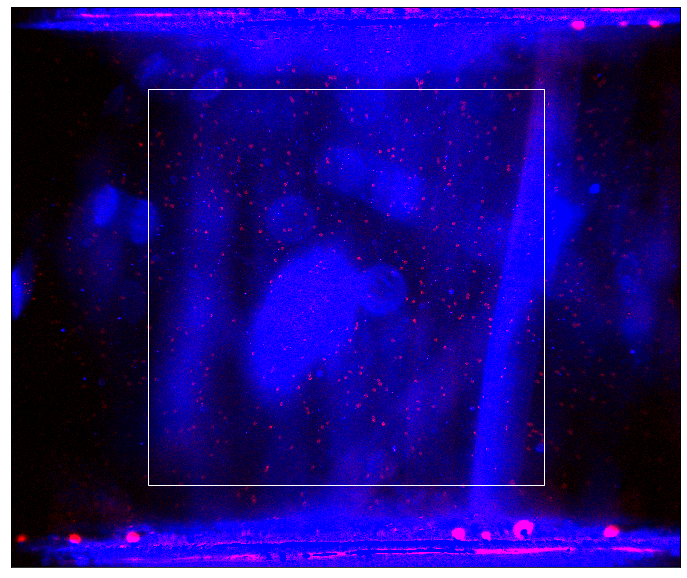

## Run `20211012-181651`:`20211012-183704` lane 3

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


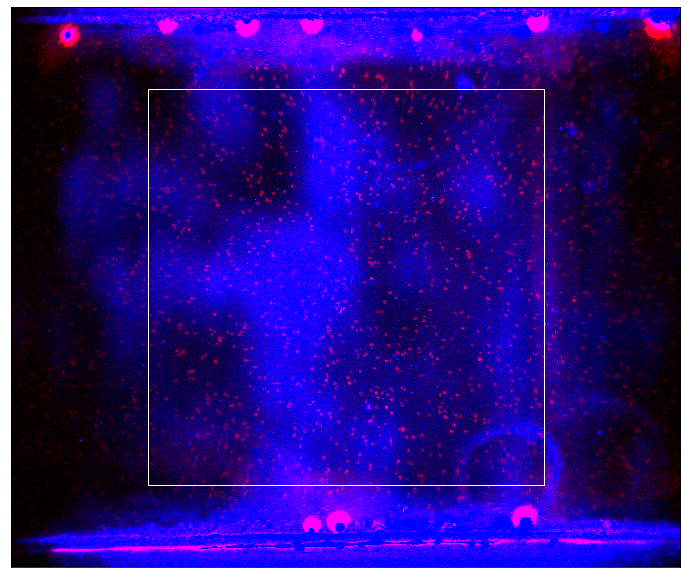

## Run `20211012-181651`:`20211012-184643` lane 7

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


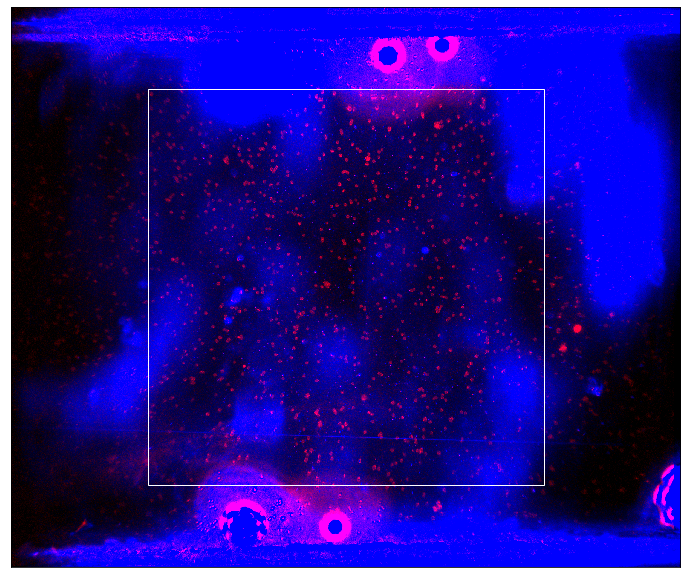

## Run `20211012-181651`:`20211012-191322` lane 1

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


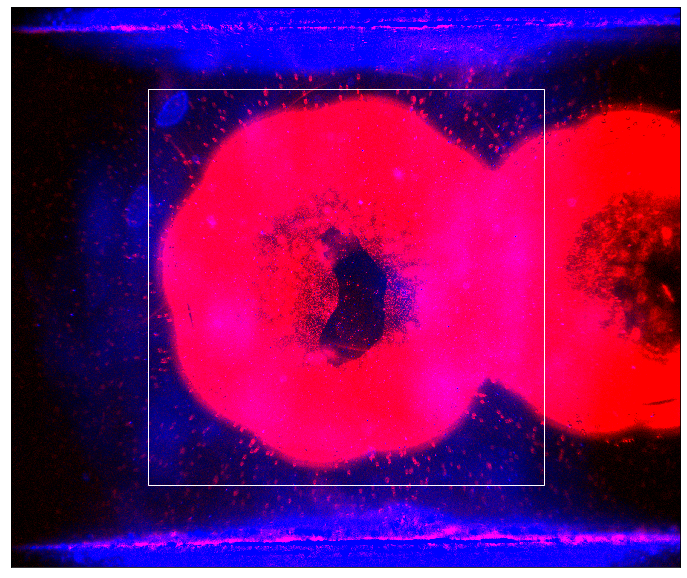

## Run `20211014-142226`:`20211014-142353` lane 0

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


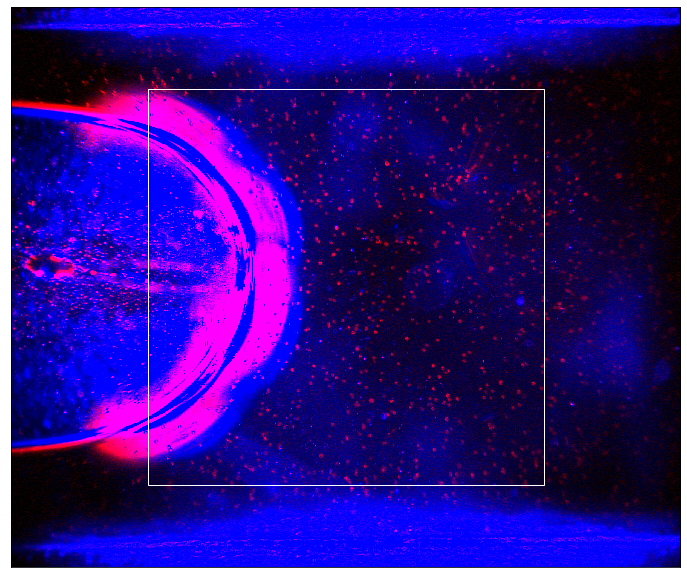

## Run `20211014-142226`:`20211014-143350` lane 4

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


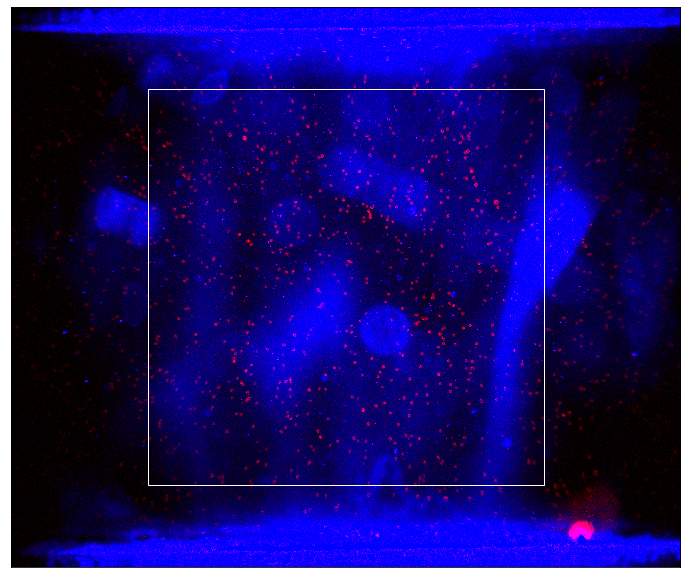

## Run `20211014-142226`:`20211014-144248` lane 3

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


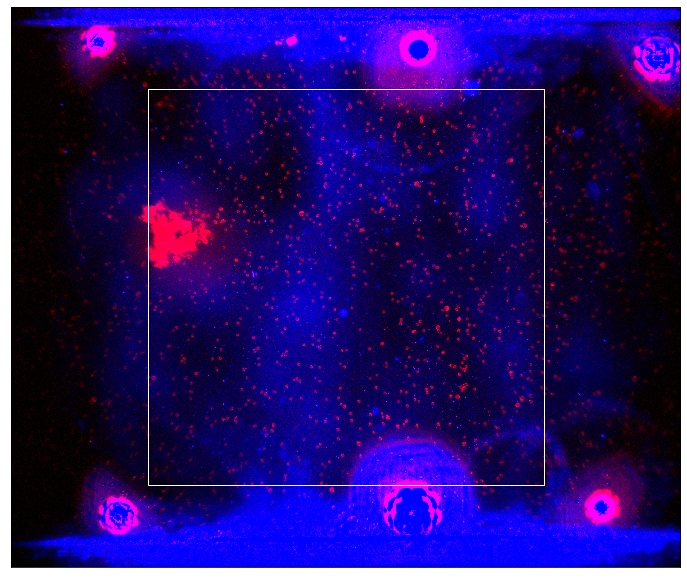

## Run `20211014-142226`:`20211014-145243` lane 5

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


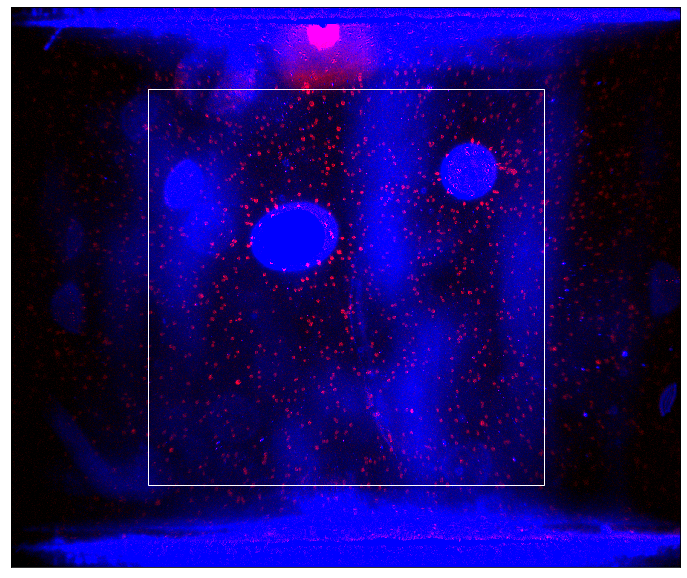

## Run `20211014-142226`:`20211014-155449` lane 6

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


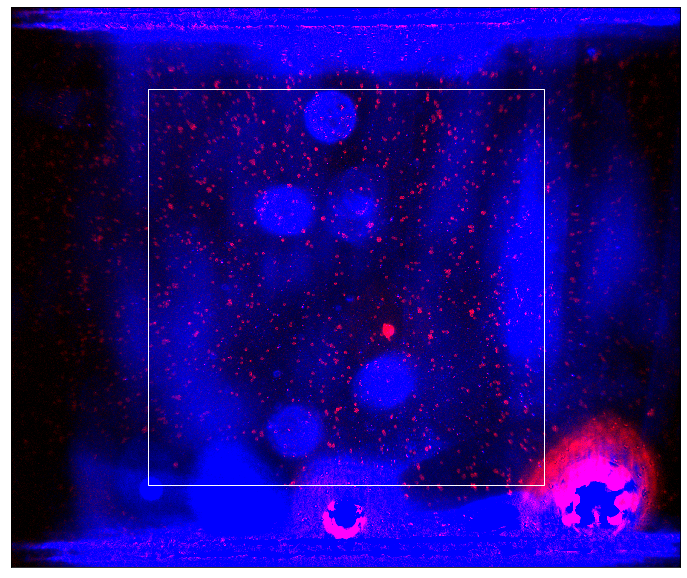

## Run `20211018-173702`:`20211018-173829` lane 0

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


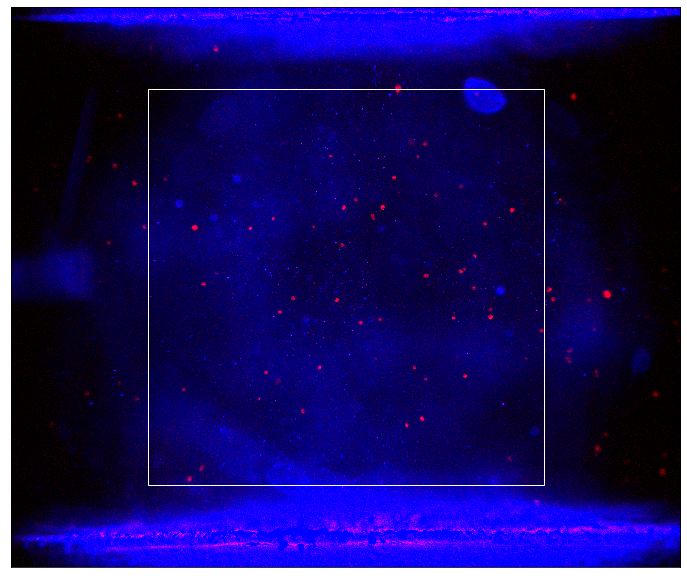

## Run `20211018-173702`:`20211018-174745` lane 1

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


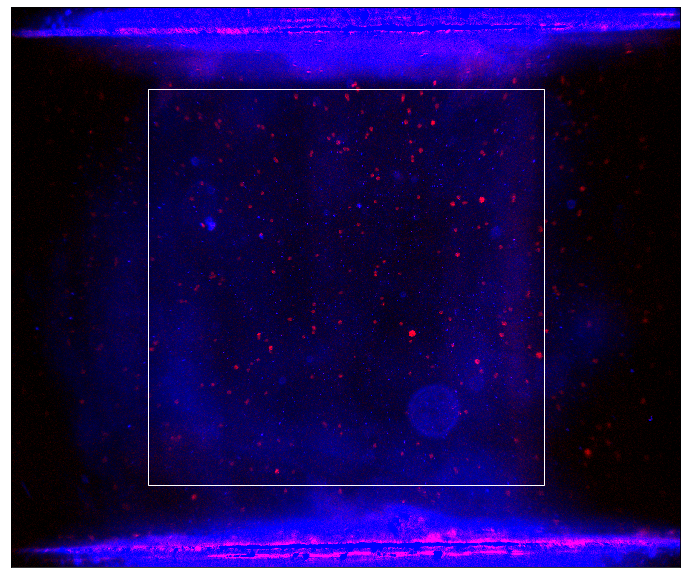

## Run `20211018-173702`:`20211018-181330` lane 0

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


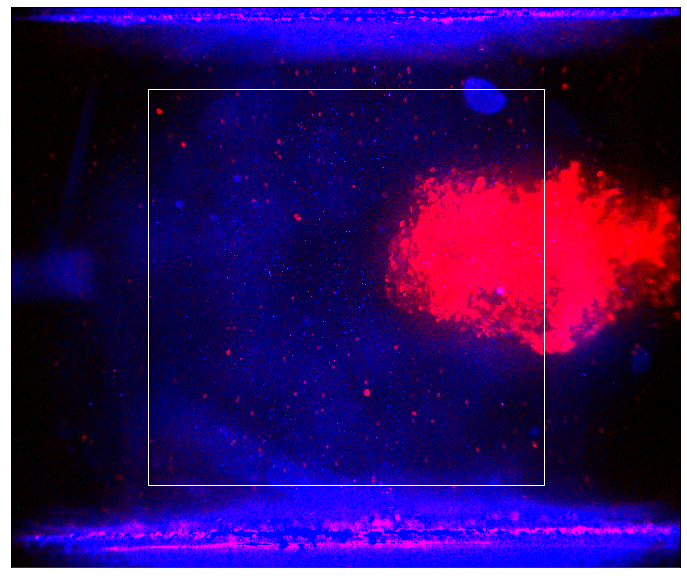

## Run `20211018-173702`:`20211018-183820` lane 1

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


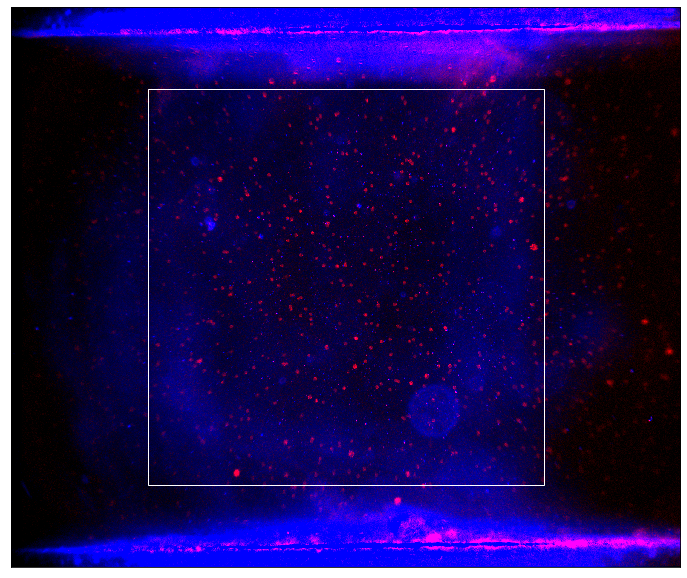

## Run `20211018-173702`:`20211018-185447` lane 3

Lossy conversion from uint16 to uint8. Losing 8 bits of resolution. Convert image to uint8 prior to saving to suppress this warning.


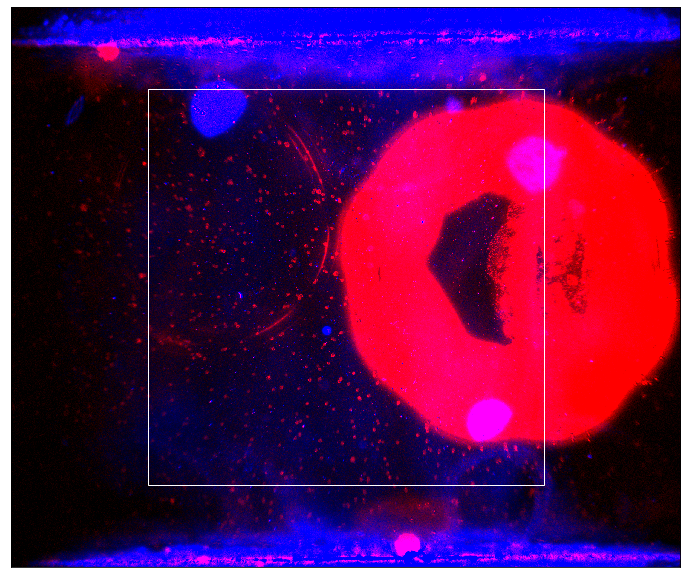

In [76]:
# Select everything from the Oct 8 dataset
DS_NAME = "20211008-193754"
TO_ANALYZE = [
    (DS_NAME, run_name, lane_no)
    for lane_no in range(8)
    for run_name in run_names[DS_NAME]]

from cci_image_processing import Cci1LegacyCellCounter
from lib_20211008 import cciip_config as cciip_config_20211008
from lib_20211008.cci_image_processing import Cci1CellCounter as Cci1CellCounter_20211008
from lib_exp import cciip_config_save as cciip_config_exp #########
from lib_exp.cci_image_processing import Cci1CellCounter as Cci1CellCounter_exp

import warnings
warnings.filterwarnings('ignore')  # Hush warnings about deprecated stuff


tester_legacy = Tester(
    name = "legacy",
    counter_cls = Cci1LegacyCellCounter,
)

tester_20211008 = Tester(
    name = "20211008",
    counter_cls = Cci1CellCounter_20211008,
    pp_params = cciip_config_20211008.CCIIP_PREPROCESSING_PARAMS,
    counting_params = cciip_config_20211008.CCIIP_COUNTING_PARAMS
)

pp_params_exp = cciip_config_exp.CCIIP_PREPROCESSING_PARAMS.copy()
counting_params_exp = cciip_config_exp.CCIIP_COUNTING_PARAMS.copy()
pp_params_exp.update({
    "cleanup_bg_brt_thresh":  0.25,
    "cleanup_bg_grow_factor": 7.5e-3,
    "cleanup_gaussian_sigma": 3.0,
})
counting_params_exp.update({
    "kernel_padding": 15,
    "blobdog_threshold": 0.2,
    "margin": 0.015,
})
tester_exp = Tester(
    name = "exp",
    counter_cls = Cci1CellCounter_exp,
    pp_params = pp_params_exp,
    counting_params = counting_params_exp,
)

test_results = {}
for ds_name, run_name, lane_no in to_analyze:
    display(Markdown(f"## Run `{ds_name}`:`{run_name}` lane {lane_no}"))
    test_results[(ds_name, run_name, lane_no)] = \
        do_the_test((tester_legacy, tester_20211008, tester_exp), ds_name, run_name, lane_no)
